In [1]:
import os
import numpy as np
from keras import applications

import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


In [2]:
DATA_DIR = '/home/ubuntu/Downloads/train/'
images_list = [file_name for file_name in os.listdir(DATA_DIR) if file_name.endswith('jpg')]

In [3]:
pretrained_vgg_16 = applications.VGG16(weights = 'imagenet', include_top = True)

In [4]:
from keras.models import Model

#building a new model that gets as input the shapes of inputs of vgg16 
# and outputs the activations on the penultimate layer of vgg16 (the layer is called fc2)
layer_name = 'fc2'
intermediate_layer_model = Model(inputs=pretrained_vgg_16.input,
                                 outputs=pretrained_vgg_16.get_layer(layer_name).output)

In [5]:
import cv2
feature_vec_list = []
for im_ind, im_name in enumerate(images_list[:100]):
    if im_ind % 100 == 0:
        print (im_ind)
    #reading the image
    im = cv2.imread(os.path.join(DATA_DIR,im_name))
    #converting form bgr to rgb
    im = cv2.cvtColor(im,cv2.COLOR_BGR2RGB)
    #resizing
    im = cv2.resize(im,(224,224))
    #adding a dummy dimension
    im = im[None]
    #extracting a feature vec for each iamge
    feature_vec = intermediate_layer_model.predict(im)
    
    #concatenating the feature vectors to one big list
    feature_vec_list.append(feature_vec.ravel())
    

0


In [6]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=6)
neigh.fit(feature_vec_list)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='minkowski',
         metric_params=None, n_jobs=1, n_neighbors=6, p=2, radius=1.0)

In [7]:
query_image_index = 1
distances, indices = neigh.kneighbors(feature_vec_list[query_image_index])

/home/ubuntu/anaconda2/envs/deep-learning/lib/python3.5/site-packages/sklearn/utils/validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


In [8]:
query_image_name = images_list[query_image_index]
nn_image_names = [images_list[image_ind] for image_ind in indices.ravel()]

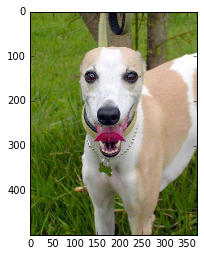

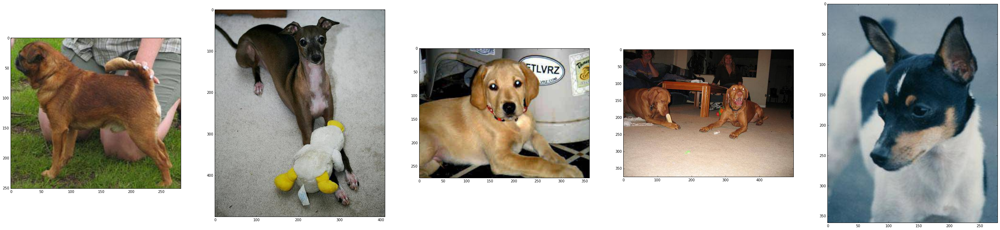

In [9]:
plt.figure()
query_image = cv2.imread(os.path.join(DATA_DIR,query_image_name))
query_image = cv2.cvtColor(query_image,cv2.COLOR_BGR2RGB)
plt.imshow(query_image)

plt.figure(figsize=(50,50))

for nn_index in range(5):
    nn_image = cv2.imread(os.path.join(DATA_DIR,nn_image_names[nn_index+1]))
    nn_image = cv2.cvtColor(nn_image,cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,nn_index+1)
    plt.imshow(nn_image)
    


In [10]:
import pickle

with open('/home/ubuntu/Downloads/dogs_features_dict.pickle','rb') as f:
    data = pickle.load(f, encoding='latin1')

In [55]:
resnet_neigh = NearestNeighbors(n_neighbors=6)
resnet_feature_vec_list = list(data.values())
resnet_neigh.fit(resnet_feature_vec_list)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='minkowski',
         metric_params=None, n_jobs=1, n_neighbors=6, p=2, radius=1.0)

In [12]:
query_image_index = 1
distances, indices = resnet_neigh.kneighbors(resnet_feature_vec_list[query_image_index][None])

In [13]:
resnet_images_list = list(data.keys())

In [14]:
query_image_name = resnet_images_list[query_image_index]
nn_image_names = [resnet_images_list[image_ind] for image_ind in indices.ravel()]

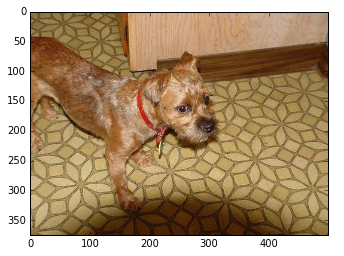

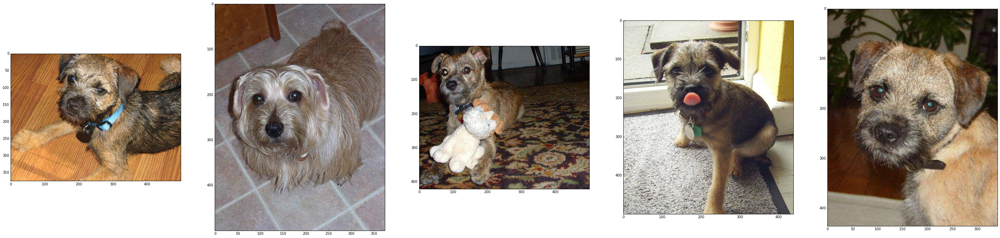

In [15]:
plt.figure()
query_image = cv2.imread(os.path.join(DATA_DIR,query_image_name))
query_image = cv2.cvtColor(query_image,cv2.COLOR_BGR2RGB)
plt.imshow(query_image)

plt.figure(figsize=(50,50))

for nn_index in range(5):
    nn_image = cv2.imread(os.path.join(DATA_DIR,nn_image_names[nn_index+1]))
    nn_image = cv2.cvtColor(nn_image,cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,nn_index+1)
    plt.imshow(nn_image)

# let's compare the models  

In [58]:
query_image_index = 2
query_image_name = images_list[query_image_index]
query_image_index_resnet_images = resnet_images_list.index(query_image_name)

In [59]:
query_image_name

'f079fbbb8684c81747227bef5303c56a.jpg'

In [61]:
resnet_images_list.index(query_image_name)

207

In [45]:
distances, indices = neigh.kneighbors(feature_vec_list[query_image_index][None])

In [46]:
query_image_name = images_list[query_image_index]
nn_image_names = [images_list[image_ind] for image_ind in indices.ravel()]

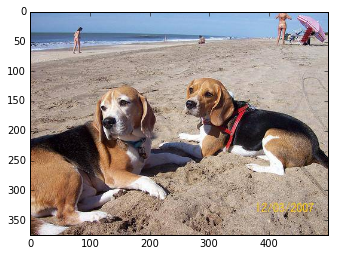

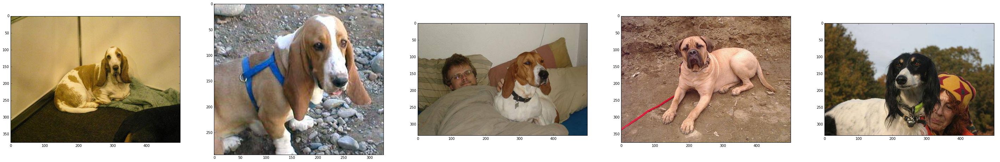

In [47]:
plt.figure()
query_image = cv2.imread(os.path.join(DATA_DIR,query_image_name))
query_image = cv2.cvtColor(query_image,cv2.COLOR_BGR2RGB)
plt.imshow(query_image)

plt.figure(figsize=(50,50))

for nn_index in range(5):
    nn_image = cv2.imread(os.path.join(DATA_DIR,nn_image_names[nn_index+1]))
    nn_image = cv2.cvtColor(nn_image,cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,nn_index+1)
    plt.imshow(nn_image)
    

In [64]:
distances, indices = resnet_neigh.kneighbors(resnet_feature_vec_list[query_image_index_resnet_images][None])

In [49]:
query_image_name = resnet_images_list[query_image_index_resnet_images]
nn_image_names = [resnet_images_list[image_ind] for image_ind in indices.ravel()]

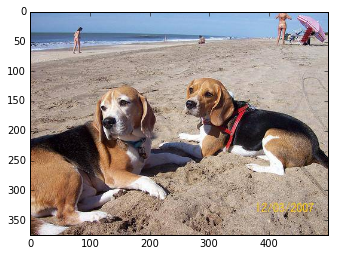

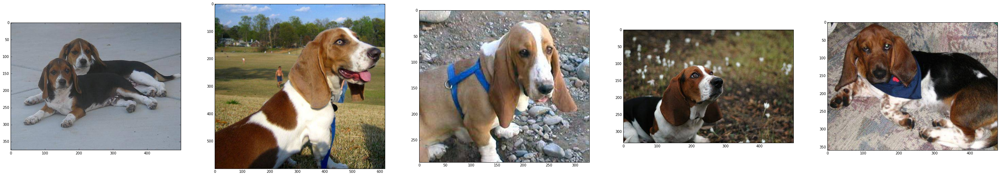

In [50]:
plt.figure()
query_image = cv2.imread(os.path.join(DATA_DIR,query_image_name))
query_image = cv2.cvtColor(query_image,cv2.COLOR_BGR2RGB)
plt.imshow(query_image)

plt.figure(figsize=(50,50))

for nn_index in range(5):
    nn_image = cv2.imread(os.path.join(DATA_DIR,nn_image_names[nn_index+1]))
    nn_image = cv2.cvtColor(nn_image,cv2.COLOR_BGR2RGB)
    plt.subplot(1,5,nn_index+1)
    plt.imshow(nn_image)
    

# Let's do classification

In [69]:
X = list(data.values())
image_names = list(data.keys())
import pandas as pd
labels_df = pd.read_csv('/home/ubuntu/Downloads/labels.csv')

In [90]:
image_names_trimmed = [im_name.split('.')[0] for im_name in image_names]

In [119]:
Y_list = []
for im_name in image_names_trimmed:
    dog_bread_label = labels_df[labels_df['id'] == im_name]['breed'].values[0]
    Y_list.append(dog_bread_label)

## divide to train and test 

In [127]:
X = np.array(X)
X_train = X[:8000]
Y_train = Y_list[:8000]

X_val = X[8000:9000]
Y_val = Y_list[8000:9000]

X_test = X[9000:]
Y_test = Y_list[9000:]

In [125]:
from sklearn.svm import LinearSVC

In [130]:
my_svm = LinearSVC(C=0.0001)

In [131]:
my_svm.fit(X_train, Y_train)

LinearSVC(C=0.0001, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)

In [136]:
my_svm.score(X_val,Y_val)

0.81899999999999995

In [132]:
val_pred = my_svm.predict(X_val)

In [151]:
val_pred[:10]

array(['french_bulldog', 'black-and-tan_coonhound', 'irish_wolfhound',
       'samoyed', 'great_dane', 'chow', 'west_highland_white_terrier',
       'bull_mastiff', 'old_english_sheepdog', 'irish_wolfhound'],
      dtype='<U30')

In [152]:
Y_val[:10]

['french_bulldog',
 'black-and-tan_coonhound',
 'old_english_sheepdog',
 'samoyed',
 'great_dane',
 'chow',
 'west_highland_white_terrier',
 'pug',
 'old_english_sheepdog',
 'irish_wolfhound']